<a href="https://colab.research.google.com/github/MarlzRana/machine-learning/blob/main/recurrent_unet_eval.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Recurrent UNet Model Evaluation

## Imports

External imports

In [ ]:
import torch
import numpy as np
import random
import albumentations as A
import h5py
from tqdm import tqdm
from pathlib import Path
import pandas as pd
from torch.utils.data import DataLoader
from torch import nn

Internal imports

In [ ]:
%run "/content/drive/My Drive/Colab Notebooks/mod_unet.ipynb"

In [ ]:
%run "/content/drive/My Drive/Colab Notebooks/recurrent_unet_non_train_18.ipynb"

## Constants

In [ ]:
LBL_MAP = {
    "road": [0],
    "sidewalk": [1],
    "human": [11, 12],
    "vehicle": [13, 14, 15, 16, 17, 18],
    "object": [5, 6, 7],
    "construction": [2, 3, 4],
    "nature": [8, 9],
    "sky": [10]
}

CHANNELS = [11, 32, 64, 128, 256, 512]

DEVICE=torch.device("cuda") if torch.cuda.is_available() else torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")

NUM_CLASSES=len(LBL_MAP)

NON_TEMP_MODEL_CHECKPOINT="/content/drive/My Drive/3yp/checkpoints/non-synth/pretrain_modresnet18_unet.pth"
IS_NON_TEMP_TRAINABLE=False

PROJECT_BASE_PTH="/content/drive/My Drive/3yp/"

PROJECT_CHECKPOINTS_PTH=PROJECT_BASE_PTH+"checkpoints/"
CHECKPOINT_FEXT=".pth"

PROJECT_LOGS_PTH=PROJECT_BASE_PTH+"logs/"
LOG_FEXT=".csv"

CHECKPOINTS_PTH=PROJECT_CHECKPOINTS_PTH+"temporal/"
LOGS_PTH=PROJECT_LOGS_PTH+"temporal/"

MODEL_NAME = "exp_recurrent_sru_unet_resnet18b_non_trainable_teacher_forcing_adjusted_weighted_dice_loss"

RESULTS_FILE_PTH=PROJECT_BASE_PTH+"results/temporal_results.csv"

## Setup random seeds

In [ ]:
torch.manual_seed(42)
random.seed(42)
np.random.seed(42)

## Copy dataset to local storage

In [ ]:
!cp "/content/drive/My Drive/3yp/datasets/kitti_step_32_256.h5" .

## Dataset Transformations

In [ ]:
def to_tensor(x, cols, rows):
  return x.transpose(2, 0, 1)

In [ ]:
img_tr = A.Compose(
    [
      A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], max_pixel_value=255),
      A.Lambda(image=to_tensor)
    ]
)

msk_tr = A.Compose([
  A.Lambda(image=to_tensor, mask=to_tensor)
])

## Load test dataset

In [ ]:
class HDF5MultSeqSegDsSepMsks(Dataset):
  def __init__(self, ds_map, lbl_map, is_out_tensor=True, joint_tr=None, img_post_tr=None, msk_post_tr=None):
    self.ds_map = ds_map
    self.lbl_map = lbl_map
    self.joint_tr = joint_tr
    self.img_post_tr = img_post_tr
    self.msk_post_tr = msk_post_tr
    self.seq_num_to_loc = []
    self.is_out_tensor = True

    for ds_name, ds_attrs in self.ds_map.items():
      with h5py.File(ds_attrs["h5_file_pth"], "r") as f:
        for act_seq_num in f[ds_attrs["sub_ds_name"]].keys():
          self.seq_num_to_loc.append({
              "ds_name": ds_name,
              "act_seq_num": act_seq_num
          })

  def __len__(self):
    return len(self.seq_num_to_loc)

  def __getitem__(self, idx):
    src_ds_name = self.seq_num_to_loc[idx]["ds_name"]
    act_seq_num = self.seq_num_to_loc[idx]["act_seq_num"]

    imgs = None
    msks = None

    with h5py.File(self.ds_map[src_ds_name]["h5_file_pth"], "r") as f:
      imgs_ds = f[self.ds_map[src_ds_name]["sub_ds_name"]][act_seq_num]["imgs"]

      if self.is_out_tensor:
        imgs = np.zeros((imgs_ds.shape[0], imgs_ds.shape[-1], imgs_ds.shape[-3], imgs_ds.shape[-2]), dtype=np.single)
      else:
        imgs = np.zeros(imgs_ds.shape, dtype=np.single)

      msks_ds = f[self.ds_map[src_ds_name]["sub_ds_name"]][act_seq_num]["msks"]

      if self.is_out_tensor:
        msks = np.zeros((msks_ds.shape[0], len(self.lbl_map), msks_ds.shape[-2], msks_ds.shape[-1]), dtype=int)
      else:
        msks = np.zeros(msks_ds.shape, dtype=int)

      for i in range(len(imgs_ds)):
        img = imgs_ds[i]
        msk = msks_ds[i]

        msk = np.stack([np.isin(msk, pixel_values).astype("float") for pixel_values in self.lbl_map.values()], axis=-1)

        if self.joint_tr:
          out_joint_tr = self.joint_tr(image=img, mask=msk)
          img, msk = out_joint_tr["image"], out_joint_tr["mask"]

        if self.img_post_tr:
          out_img_post_tr = self.img_post_tr(image=img)
          img = out_img_post_tr["image"]

        if self.msk_post_tr:
          out_msk_post_tr = self.msk_post_tr(image=msk, mask=msk)
          msk = out_msk_post_tr["mask"]

        imgs[i] = img
        msks[i] = msk



    return act_seq_num, imgs, msks

  def get_unproc(self, idx):
    src_ds_name = self.seq_num_to_loc[idx]["ds_name"]
    act_seq_num = self.seq_num_to_loc[idx]["act_seq_num"]

    imgs = None
    msks = None

    with h5py.File(self.ds_map[src_ds_name]["h5_file_pth"], "r") as f:
      imgs_ds = f[self.ds_map[src_ds_name]["sub_ds_name"]][act_seq_num]["imgs"]

      if self.is_out_tensor:
        imgs = np.zeros((imgs_ds.shape[0], imgs_ds.shape[-1], imgs_ds.shape[-3], imgs_ds.shape[-2]), dtype=np.single)
      else:
        imgs = np.zeros(imgs_ds.shape, dtype=np.single)

      msks_ds = f[self.ds_map[src_ds_name]["sub_ds_name"]][act_seq_num]["msks"]

      if self.is_out_tensor:
        msks = np.zeros((msks_ds.shape[0], len(self.lbl_map), msks_ds.shape[-2], msks_ds.shape[-1]), dtype=int)
      else:
        msks = np.zeros(msks_ds.shape, dtype=int)

      for i in range(len(imgs_ds)):
        img = imgs_ds[i]
        msk = msks_ds[i]

        msk = np.stack([np.isin(msk, pixel_values).astype("float") for pixel_values in self.lbl_map.values()], axis=-1)

        if self.is_out_tensor:
          img_tr = A.Compose(
              [
                A.Lambda(image=to_tensor)
              ]
          )

          out_tr = img_tr(image=img)
          img = out_tr["image"]
          out_tr_2 = img_tr(image=msk)
          msk = out_tr_2["image"]


        imgs[i] = img
        msks[i] = msk



    return act_seq_num, imgs, msks

In [ ]:
test_ds = HDF5MultSeqSegDsSepMsks(
    ds_map={
        "gta_train": {
            "h5_file_pth": "./kitti_step_32_256.h5",
            "sub_ds_name": "test"
        },
    },
    lbl_map=LBL_MAP,
    img_post_tr=img_tr,
    msk_post_tr=msk_tr
)

In [ ]:
test_dl = DataLoader(test_ds, batch_size=1, num_workers=2)

## Load in model

In [ ]:
model = torch.load(CHECKPOINTS_PTH + MODEL_NAME + CHECKPOINT_FEXT).to(DEVICE)

## Dice Loss

In [ ]:
class DiceCoefficient(nn.Module):
  def __init__(self, smooth=1.0):
    super().__init__()
    self.smooth = smooth

  def forward(self, pred_y, ground_y):
    flat_pred_y = pred_y.reshape(-1)
    flat_ground_y = ground_y.reshape(-1)

    intersection = (flat_pred_y * flat_ground_y).sum()

    return (2 * intersection + self.smooth) / (flat_pred_y.sum() + flat_ground_y.sum() + self.smooth)

  def get_name(self) -> str:
    return "dice_coefficient"

dice_coefficient = DiceCoefficient()

In [ ]:
class DiceLoss(nn.Module):
  def __init__(self, smooth=1.0):
    super().__init__()
    self.metric = DiceCoefficient(smooth=smooth)

  def forward(self, pred_y, ground_y):
    dice_coefficient = self.metric(pred_y, ground_y)

    return 1 - dice_coefficient

In [ ]:
loss_fn = DiceLoss()

In [ ]:
def eval():
    model.eval()
    model.non_temp_model.eval()

    with torch.no_grad():
      with tqdm(total=len(test_dl)) as pbar:
        total_loss = 0
        total_loss_count = 0
        prev_seq_id = None

        # Train the model on each batch
        for batch_idx, (SEQ_ID, X_SEQ, Y_SEQ) in enumerate(test_dl):
          curr_seq_id = SEQ_ID[0][:4]
          X_SEQ = X_SEQ.type(torch.float).to(DEVICE)
          Y_SEQ = Y_SEQ.to(DEVICE)

          if (X_SEQ.shape[1] < 32):
            del X_SEQ
            del Y_SEQ
            continue

          if ((prev_seq_id is None) or prev_seq_id != curr_seq_id):
            preds, Ht = model(X_SEQ)
          else:
            preds, Ht = model(X_SEQ, Ht.detach(), prev_seg_mask.detach())

          loss = loss_fn(preds[0], Y_SEQ[0])

          total_loss += loss.item()
          total_loss_count += 1

          prev_seg_mask = preds[:, 0]
          prev_seq_id = curr_seq_id
          # Update the progress bar, informing we have processed X.shape[0] aka len(X) images
          pbar.update(1)
          pbar.set_postfix({"eval_loss": total_loss / total_loss_count})
          del X_SEQ
          del Y_SEQ

        return total_loss / total_loss_count

In [ ]:
# eval()

## Qualitative Results

In [ ]:
import matplotlib.pyplot as plt

def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

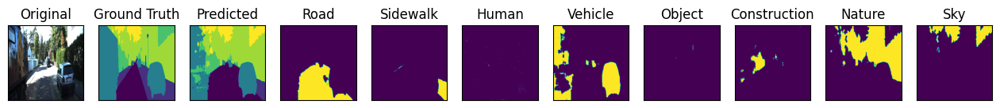

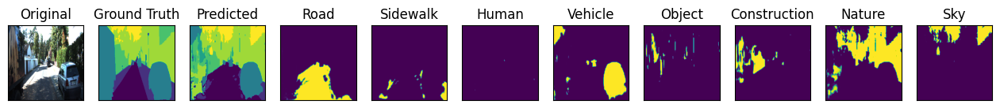

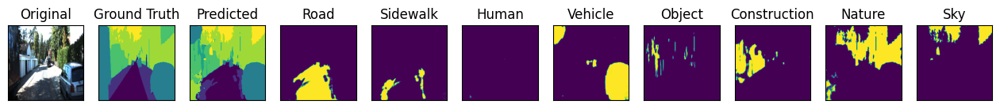

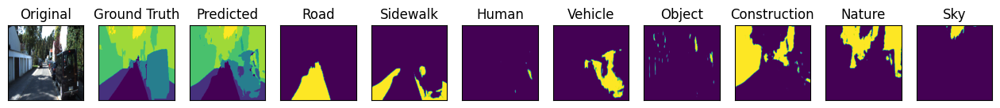

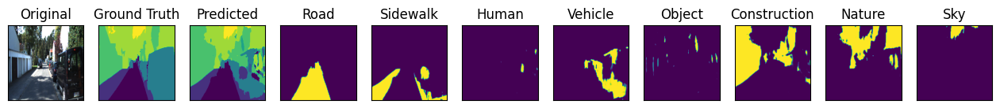

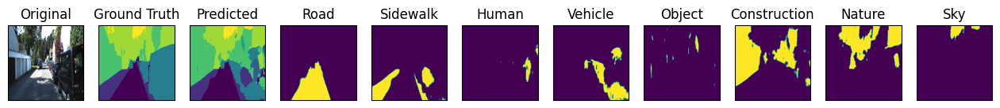

In [ ]:
seq_of_interest = 11
seq_idx_of_interest = [0, 1, 2, 28, 29, 30]

act_seq_id, original_imgs, original_msks = test_ds.get_unproc(seq_of_interest)
_, transformed_imgs, transformed_msks = test_ds[seq_of_interest]
# print(original_imgs.shape)
# print(original_msks.shape)
# print(transformed_imgs.shape)
# print(transformed_msks.shape)

model_out = None
with torch.no_grad():
  model_out, Ht = model(torch.Tensor(np.expand_dims(transformed_imgs, 0)).to(DEVICE))

for seq_idx in seq_idx_of_interest:
  visualize(
    original=(original_imgs[seq_idx].transpose(1, 2, 0).astype(int)),
    ground_truth=np.argmax(original_msks[seq_idx], 0),
    predicted=torch.argmax(model_out[0][seq_idx], 0).cpu().detach(),
    road=model_out[0][seq_idx][0].cpu().detach(),
    sidewalk=model_out[0][seq_idx][1].cpu().detach(),
    human=model_out[0][seq_idx][2].cpu().detach(),
    vehicle=model_out[0][seq_idx][3].cpu().detach(),
    object=model_out[0][seq_idx][4].cpu().detach(),
    construction=model_out[0][seq_idx][5].cpu().detach(),
    nature=model_out[0][seq_idx][6].cpu().detach(),
    sky=model_out[0][seq_idx][7].cpu().detach(),
  )

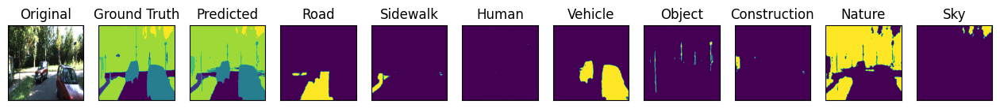

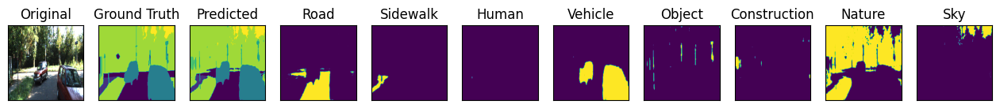

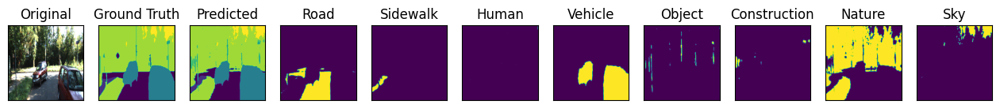

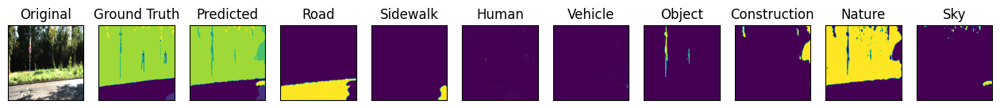

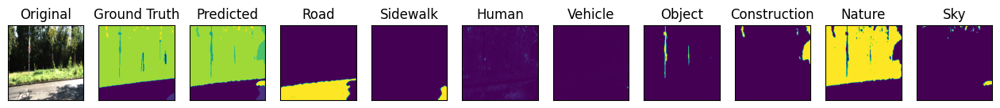

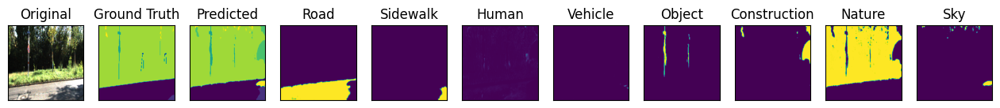

In [ ]:
seq_of_interest = 25
seq_idx_of_interest = [0, 1, 2, 28, 29, 30]

act_seq_id, original_imgs, original_msks = test_ds.get_unproc(seq_of_interest)
_, transformed_imgs, transformed_msks = test_ds[seq_of_interest]
# print(original_imgs.shape)
# print(original_msks.shape)
# print(transformed_imgs.shape)
# print(transformed_msks.shape)

model_out = None
with torch.no_grad():
  model_out, Ht = model(torch.Tensor(np.expand_dims(transformed_imgs, 0)).to(DEVICE))

for seq_idx in seq_idx_of_interest:
  visualize(
    original=(original_imgs[seq_idx].transpose(1, 2, 0).astype(int)),
    ground_truth=np.argmax(original_msks[seq_idx], 0),
    predicted=torch.argmax(model_out[0][seq_idx], 0).cpu().detach(),
    road=model_out[0][seq_idx][0].cpu().detach(),
    sidewalk=model_out[0][seq_idx][1].cpu().detach(),
    human=model_out[0][seq_idx][2].cpu().detach(),
    vehicle=model_out[0][seq_idx][3].cpu().detach(),
    object=model_out[0][seq_idx][4].cpu().detach(),
    construction=model_out[0][seq_idx][5].cpu().detach(),
    nature=model_out[0][seq_idx][6].cpu().detach(),
    sky=model_out[0][seq_idx][7].cpu().detach(),
  )

In [ ]:
from IPython.display import Javascript
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 200})'''))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

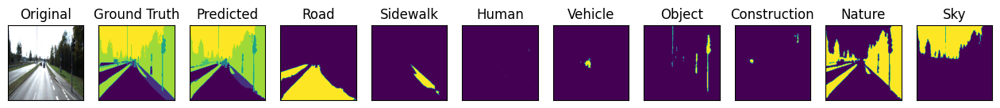

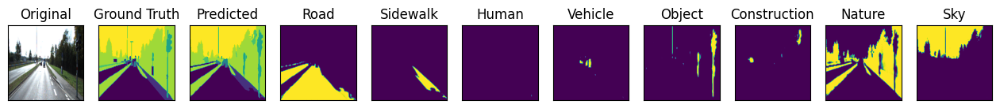

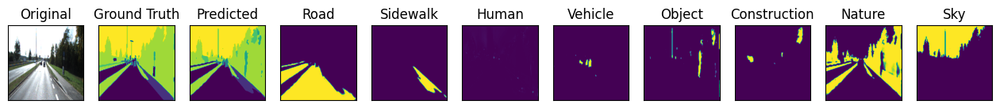

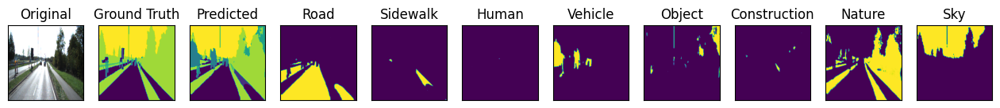

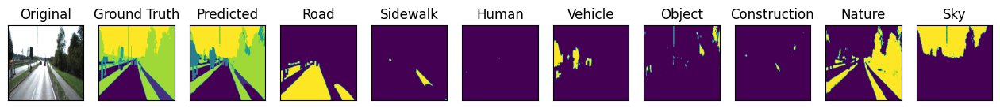

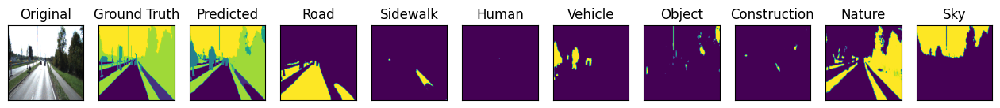

In [ ]:
from IPython.display import Javascript
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 140})'''))

seq_of_interest = 42
seq_idx_of_interest = [0, 1, 2, 28, 29, 30]

act_seq_id, original_imgs, original_msks = test_ds.get_unproc(seq_of_interest)
_, transformed_imgs, transformed_msks = test_ds[seq_of_interest]
# print(original_imgs.shape)
# print(original_msks.shape)
# print(transformed_imgs.shape)
# print(transformed_msks.shape)

model_out = None
with torch.no_grad():
  model_out, Ht = model(torch.Tensor(np.expand_dims(transformed_imgs, 0)).to(DEVICE))

for seq_idx in seq_idx_of_interest:
  visualize(
    original=(original_imgs[seq_idx].transpose(1, 2, 0).astype(int)),
    ground_truth=np.argmax(original_msks[seq_idx], 0),
    predicted=torch.argmax(model_out[0][seq_idx], 0).cpu().detach(),
    road=model_out[0][seq_idx][0].cpu().detach(),
    sidewalk=model_out[0][seq_idx][1].cpu().detach(),
    human=model_out[0][seq_idx][2].cpu().detach(),
    vehicle=model_out[0][seq_idx][3].cpu().detach(),
    object=model_out[0][seq_idx][4].cpu().detach(),
    construction=model_out[0][seq_idx][5].cpu().detach(),
    nature=model_out[0][seq_idx][6].cpu().detach(),
    sky=model_out[0][seq_idx][7].cpu().detach(),
  )

<IPython.core.display.Javascript object>

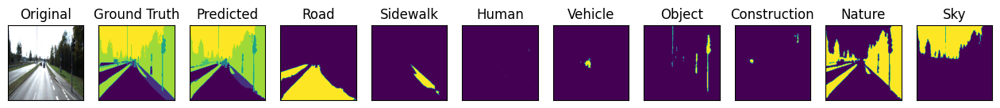

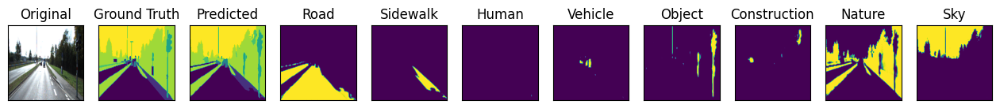

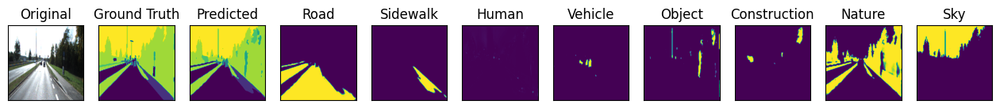

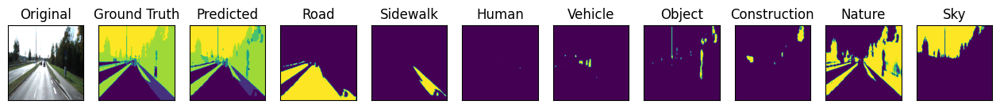

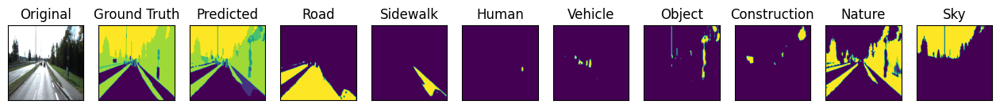

...

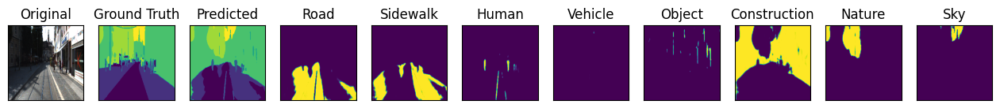

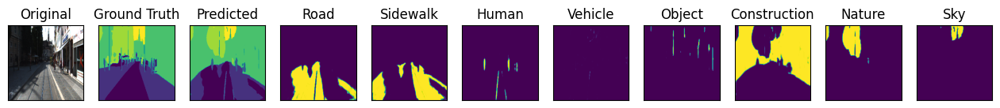

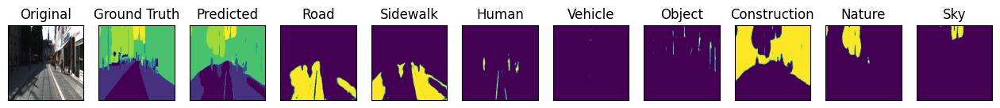

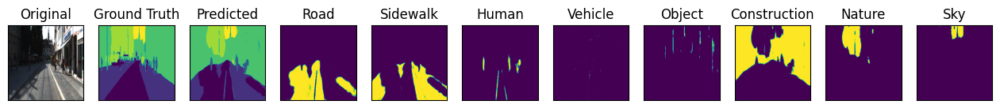

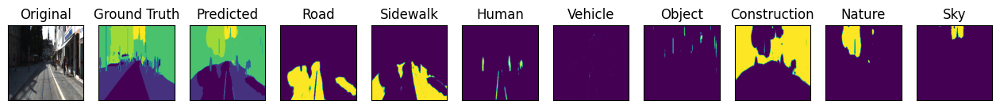

KeyboardInterrupt: 

In [ ]:
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 140})'''))


seq_idx_of_interest = [i for i in range(32)]

prev_seq_id = None
prev_seg_mask = None

my_seq_of_interest = [42, 43, 44, 45, 46]
for seq_of_interest in range(len(test_ds)):
  seq_id, original_imgs, original_msks = test_ds.get_unproc(seq_of_interest)
  _, transformed_imgs, transformed_msks = test_ds[seq_of_interest]

  curr_seq_id = seq_id[:4]

  model_out = None

  if ((prev_seq_id is None) or prev_seq_id != curr_seq_id):
    with torch.no_grad():
      model_out, Ht = model(torch.Tensor(np.expand_dims(transformed_imgs, 0)).to(DEVICE))
  else:
      model_out, Ht = model(torch.Tensor(np.expand_dims(transformed_imgs, 0)).to(DEVICE), Ht.detach(), prev_seg_mask.detach())

  # if seq_of_interest + 1 < len(test_ds) and test_ds.seq_num_to_loc[seq_of_interest + 1]["act_seq_num"][:4] != curr_seq_id:
  if seq_of_interest in my_seq_of_interest:
    for seq_idx in seq_idx_of_interest:
      visualize(
        original=(original_imgs[seq_idx].transpose(1, 2, 0).astype(int)),
        ground_truth=np.argmax(original_msks[seq_idx], 0),
        predicted=torch.argmax(model_out[0][seq_idx], 0).cpu().detach(),
        road=model_out[0][seq_idx][0].cpu().detach(),
        sidewalk=model_out[0][seq_idx][1].cpu().detach(),
        human=model_out[0][seq_idx][2].cpu().detach(),
        vehicle=model_out[0][seq_idx][3].cpu().detach(),
        object=model_out[0][seq_idx][4].cpu().detach(),
        construction=model_out[0][seq_idx][5].cpu().detach(),
        nature=model_out[0][seq_idx][6].cpu().detach(),
        sky=model_out[0][seq_idx][7].cpu().detach(),
      )

    prev_seg_mask = model_out[:, 0]
    prev_seq_id = curr_seq_id

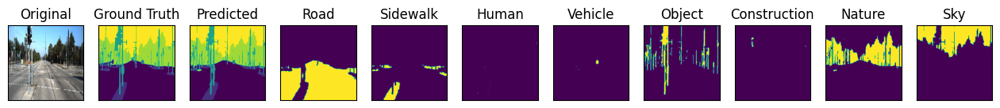

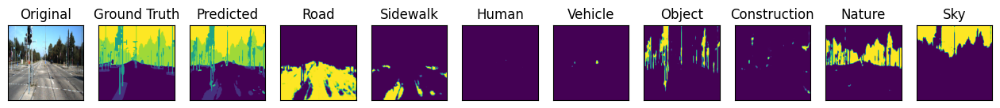

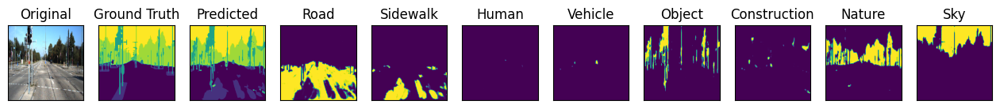

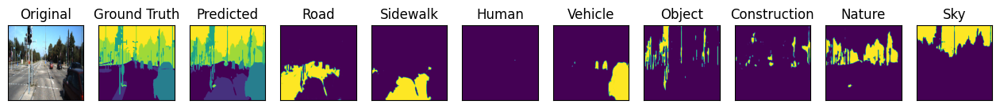

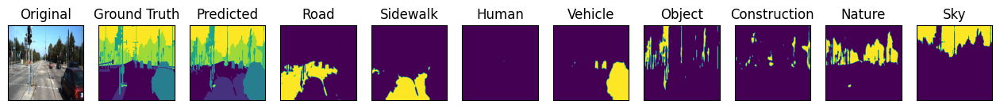

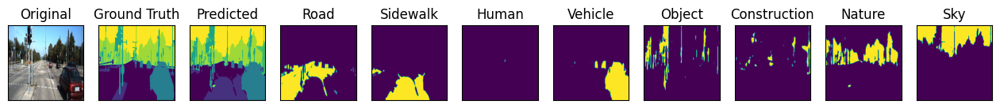

In [ ]:
seq_of_interest = 1
seq_idx_of_interest = [0, 1, 2, 28, 29, 30]

act_seq_id, original_imgs, original_msks = test_ds.get_unproc(seq_of_interest)
_, transformed_imgs, transformed_msks = test_ds[seq_of_interest]
# print(original_imgs.shape)
# print(original_msks.shape)
# print(transformed_imgs.shape)
# print(transformed_msks.shape)


model_out = None
with torch.no_grad():
  model_out, Ht = model(torch.Tensor(np.expand_dims(transformed_imgs, 0)).to(DEVICE))

for seq_idx in seq_idx_of_interest:
  visualize(
    original=(original_imgs[seq_idx].transpose(1, 2, 0).astype(int)),
    ground_truth=np.argmax(original_msks[seq_idx], 0),
    predicted=torch.argmax(model_out[0][seq_idx], 0).cpu().detach(),
    road=model_out[0][seq_idx][0].cpu().detach(),
    sidewalk=model_out[0][seq_idx][1].cpu().detach(),
    human=model_out[0][seq_idx][2].cpu().detach(),
    vehicle=model_out[0][seq_idx][3].cpu().detach(),
    object=model_out[0][seq_idx][4].cpu().detach(),
    construction=model_out[0][seq_idx][5].cpu().detach(),
    nature=model_out[0][seq_idx][6].cpu().detach(),
    sky=model_out[0][seq_idx][7].cpu().detach(),
  )

## Metrics Of Interest

In [ ]:
class IoU(nn.Module):
  def __init__(self, smooth=1.0):
    super().__init__()
    self.smooth = smooth

  def forward(self, pred_y, ground_y):
    flat_pred_y = pred_y.view(-1)
    flat_ground_y = ground_y.view(-1)

    intersection = (flat_pred_y * flat_ground_y).sum()
    union = (flat_pred_y + flat_ground_y).sum() - intersection

    return (intersection + self.smooth) / (union + self.smooth)

  def get_name(self) -> str:
    return "iou"

iou = IoU()

In [ ]:
class DiceCoefficient(nn.Module):
  def __init__(self, smooth=1.0):
    super().__init__()
    self.smooth = smooth

  def forward(self, pred_y, ground_y):
    flat_pred_y = pred_y.view(-1)
    flat_ground_y = ground_y.view(-1)

    intersection = (flat_pred_y * flat_ground_y).sum()

    return (2 * intersection + self.smooth) / (flat_pred_y.sum() + flat_ground_y.sum() + self.smooth)

  def get_name(self) -> str:
    return "dice_coefficient"

dice_coefficient = DiceCoefficient()

# NonTrainEvalEpoch

In [ ]:
class NonTrainEvalEpoch():
  def __init__(self, dataloader, model, metrics, device, per_cls_metrics=False, num_cls=0, cls_labels=[]):
    self.dataloader = dataloader
    self.model = model
    self.metrics = metrics
    self.device = device
    self.per_cls_metrics = per_cls_metrics
    self.num_cls=num_cls
    self.cls_labels=cls_labels

  def run(self):
    # Put the model into evaluation model
    self.model.eval()

    total_loss = 0

    total_agg_metric_vals = [0 for i in range(len(self.metrics))]

    total_cls_metric_vals = None

    some_count = 0

    if self.per_cls_metrics:
      total_cls_metric_vals = [{metric.get_name(): 0 for metric in self.metrics} for i in range(self.num_cls)]

    with torch.no_grad(), tqdm(total=len(self.dataloader.dataset)) as pbar:
      prev_seq_id = None
      prev_seg_mask = None
      # Evaluate the model on each batch
      for batch_idx, (SEQ_ID, X_SEQ, Y_SEQ) in enumerate(self.dataloader):
        # Put X and Y on to the requested device
        curr_seq_id = SEQ_ID[0][:4]
        X_SEQ = X_SEQ.type(torch.float).to(DEVICE)
        Y_SEQ = Y_SEQ.to(DEVICE)

        if (X_SEQ.shape[1] < 32):
            del X_SEQ
            del Y_SEQ
            continue

        if ((prev_seq_id is None) or prev_seq_id != curr_seq_id):
            preds, Ht = model(X_SEQ)
        else:
            preds, Ht = model(X_SEQ, Ht.detach(), prev_seg_mask.detach())

        # Update the progress bar, informing we have processed X.shape[0] aka len(X) images
        pbar.update(1)

        # Update the agg total metric values
        postfix_dict = {}
        for i, metric in enumerate(self.metrics):
          total_agg_metric_vals[i] += metric(preds[0], Y_SEQ[0]).item()
          postfix_dict[metric.get_name()] = total_agg_metric_vals[i] / (batch_idx + 1)

        # Update the per class metrics if required
        if self.per_cls_metrics:
          for i in range(self.num_cls):
            pred_i = preds[0][:, i]
            ground_i = Y_SEQ[0][:, i]

            for metric in self.metrics:
              total_cls_metric_vals[i][metric.get_name()] += metric(pred_i.reshape(-1), ground_i.reshape(-1)).item()


        prev_seg_mask = preds[:, 0]
        prev_seq_id = curr_seq_id

        # Update the progress bar with the value of the current metrics
        pbar.set_postfix(postfix_dict)

        del X_SEQ
        del Y_SEQ

    # Build the return value for the aggregrate results
    ret_metrics = {}

    for i, metric in enumerate(self.metrics):
      ret_metrics[f"overall_{metric.get_name()}"] =  total_agg_metric_vals[i] / len(self.dataloader)
      ret_metrics[f"mean_{metric.get_name()}"] = 0.0

    if self.per_cls_metrics:
      for i in range(len(total_cls_metric_vals)):
        for metric in self.metrics:
          ret_metrics[f"mean_{metric.get_name()}"] += total_cls_metric_vals[i][metric.get_name()] / len(self.dataloader)
          ret_metrics[f"{i}_{metric.get_name()}_{self.cls_labels[i]}"] = total_cls_metric_vals[i][metric.get_name()] / len(self.dataloader)

    for metric in self.metrics:
      ret_metrics[f"mean_{metric.get_name()}"] /= self.num_cls

    # Return only the return value for the aggregrate results if we do not need per class metrics
    return ret_metrics

val_epoch = NonTrainEvalEpoch(
    dataloader=test_dl,
    model=model,
    metrics=[iou, dice_coefficient],
    device=DEVICE,
    per_cls_metrics=True,
    num_cls=NUM_CLASSES,
    cls_labels=list(LBL_MAP.keys())
)

out = val_epoch.run()

100%|██████████| 64/64 [00:16<00:00,  3.91it/s, iou=0.64, dice_coefficient=0.776]


In [ ]:
out

{'overall_iou': 0.6404774128459394,
 'mean_iou': 0.4250111331103321,
 'overall_dice_coefficient': 0.776414998807013,
 'mean_dice_coefficient': 0.5195445039900903,
 '0_iou_road': 0.6242521329979311,
 '0_dice_coefficient_road': 0.7077750206298674,
 '1_iou_sidewalk': 0.3418787177142235,
 '1_dice_coefficient_sidewalk': 0.464223019874737,
 '2_iou_human': 0.07740140280384367,
 '2_dice_coefficient_human': 0.11234760633396945,
 '3_iou_vehicle': 0.3906935709374011,
 '3_dice_coefficient_vehicle': 0.49678140475862165,
 '4_iou_object': 0.21031137020099777,
 '4_dice_coefficient_object': 0.3219801896975696,
 '5_iou_construction': 0.3234969387762021,
 '5_dice_coefficient_construction': 0.4243977500780147,
 '6_iou_nature': 0.7240316662937403,
 '6_dice_coefficient_nature': 0.8311938205733895,
 '7_iou_sky': 0.7080232651583174,
 '7_dice_coefficient_sky': 0.7976572199745533}

In [ ]:
class ResultLogger():
  def __init__(
      self,
      log_file_pth: Path
    ):
    self.log_file_pth = log_file_pth
    self.df_log = pd.read_csv(log_file_pth)

  def add_row(
      self,
      model_name,
      new_row_data
    ) -> None:

    new_row_data["model_name"] = model_name

    self.df_log.loc[len(self.df_log)] = new_row_data

    self.df_log.to_csv(self.log_file_pth, index=False)

  @classmethod
  def create_log_file(cls, log_file_pth: Path, metrics) -> None:
    columns = [
        "model_name",
        "overall_iou",
        "overall_dice_coefficient",
        "mean_iou",
        "mean_dice_coefficient",
        *[f"{class_idx}_{metric.get_name()}_{class_name}" for class_idx, class_name in enumerate(LBL_MAP.keys()) for metric in metrics]
    ]

    dtypes = {
        "model_name": "str",
        "overall_iou": "float",
        "overall_dice_coefficient": "float",
        "mean_iou": "float",
        "mean_dice_coefficient": "float",
        **{f"{class_idx}_{metric.get_name()}_{class_name}":"float" for class_idx, class_name in enumerate(LBL_MAP.keys()) for metric in metrics}
    }


    df = pd.DataFrame(columns=columns).astype(dtypes)

    df.to_csv(log_file_pth, index=False)

# ResultLogger.create_log_file(RESULTS_FILE_PTH, [iou, dice_coefficient])

In [ ]:
result_logger = ResultLogger(RESULTS_FILE_PTH)
result_logger.add_row(MODEL_NAME, out)

## Get runtime

In [ ]:
import torch
from torch.autograd import profiler

In [ ]:
model.eval()
input = torch.randn(1, 32, 3, 224, 224).to(DEVICE)

with profiler.profile(use_cuda=True) as prof:
    with torch.no_grad():
        output = model(input)

print(prof.key_averages().table(sort_by="cpu_time_total"))

-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                      aten::convolution         2.30%       8.721ms        53.87%     204.458ms     252.106us       8.746ms         2.19%     223.822ms     275.983us           811  
                                     aten::_convolution         3.38%      12.828ms        51.11%     194.003ms     239.215us      10.235ms         2.57%     215.076ms     265.199us           811  
         

## Regular ModUNet

In [ ]:
model = torch.load("/content/drive/My Drive/3yp/checkpoints/non-synth/pretrain_modresnet34_unet.pth").to(DEVICE)

In [ ]:
class NonTrainEvalEpoch():
  def __init__(self, dataloader, model, metrics, device, per_cls_metrics=False, num_cls=0, cls_labels=[]):
    self.dataloader = dataloader
    self.model = model
    self.metrics = metrics
    self.device = device
    self.per_cls_metrics = per_cls_metrics
    self.num_cls=num_cls
    self.cls_labels=cls_labels

  def run(self):
    # Put the model into evaluation model
    self.model.eval()

    total_loss = 0

    total_agg_metric_vals = [0 for i in range(len(self.metrics))]

    total_cls_metric_vals = None

    some_count = 0

    if self.per_cls_metrics:
      total_cls_metric_vals = [{metric.get_name(): 0 for metric in self.metrics} for i in range(self.num_cls)]

    with torch.no_grad(), tqdm(total=len(self.dataloader.dataset)) as pbar:
      # Evaluate the model on each batch
      for batch_idx, (SEQ_ID, X_SEQ, Y_SEQ) in enumerate(self.dataloader):
        # Put X and Y on to the requested device
        curr_seq_id = SEQ_ID[0][:4]
        X_SEQ = X_SEQ.type(torch.float).to(DEVICE)
        Y_SEQ = Y_SEQ.to(DEVICE)

        if (X_SEQ.shape[1] < 32):
            del X_SEQ
            del Y_SEQ
            continue

        preds= model(X_SEQ[0])

        # Update the progress bar, informing we have processed X.shape[0] aka len(X) images
        pbar.update(1)

        # Update the agg total metric values
        postfix_dict = {}
        for i, metric in enumerate(self.metrics):
          total_agg_metric_vals[i] += metric(preds, Y_SEQ[0]).item()
          postfix_dict[metric.get_name()] = total_agg_metric_vals[i] / (batch_idx + 1)

        # Update the per class metrics if required
        if self.per_cls_metrics:
          for i in range(self.num_cls):
            pred_i = preds[:, i]
            ground_i = Y_SEQ[0][:, i]

            for metric in self.metrics:
              total_cls_metric_vals[i][metric.get_name()] += metric(pred_i.reshape(-1), ground_i.reshape(-1)).item()

        # Update the progress bar with the value of the current metrics
        pbar.set_postfix(postfix_dict)

        del X_SEQ
        del Y_SEQ

    # Build the return value for the aggregrate results
    ret_metrics = {}

    for i, metric in enumerate(self.metrics):
      ret_metrics[f"overall_{metric.get_name()}"] =  total_agg_metric_vals[i] / len(self.dataloader)
      ret_metrics[f"mean_{metric.get_name()}"] = 0.0

    if self.per_cls_metrics:
      for i in range(len(total_cls_metric_vals)):
        for metric in self.metrics:
          ret_metrics[f"mean_{metric.get_name()}"] += total_cls_metric_vals[i][metric.get_name()] / len(self.dataloader)
          ret_metrics[f"{i}_{metric.get_name()}_{self.cls_labels[i]}"] = total_cls_metric_vals[i][metric.get_name()] / len(self.dataloader)

    for metric in self.metrics:
      ret_metrics[f"mean_{metric.get_name()}"] /= self.num_cls

    # Return only the return value for the aggregrate results if we do not need per class metrics
    return ret_metrics

val_epoch = NonTrainEvalEpoch(
    dataloader=test_dl,
    model=model,
    metrics=[iou, dice_coefficient],
    device=DEVICE,
    per_cls_metrics=True,
    num_cls=NUM_CLASSES,
    cls_labels=list(LBL_MAP.keys())
)

out = val_epoch.run()

  0%|          | 0/64 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 64/64 [00:45<00:00,  1.41it/s, iou=0.789, dice_coefficient=0.878]


In [ ]:
out

{'overall_iou': 0.7888425411656499,
 'mean_iou': 0.5627307389138139,
 'overall_dice_coefficient': 0.878385097719729,
 'mean_dice_coefficient': 0.6538766846953621,
 '0_iou_road': 0.6833425360037495,
 '0_dice_coefficient_road': 0.7457708301369621,
 '1_iou_sidewalk': 0.5028166700822112,
 '1_dice_coefficient_sidewalk': 0.6364853619161863,
 '2_iou_human': 0.24093227855883015,
 '2_dice_coefficient_human': 0.29336853366294235,
 '3_iou_vehicle': 0.6378160550957546,
 '3_dice_coefficient_vehicle': 0.7444118394923862,
 '4_iou_object': 0.3876066557204467,
 '4_dice_coefficient_object': 0.5417876986466581,
 '5_iou_construction': 0.42852420121323576,
 '5_dice_coefficient_construction': 0.5167358036086398,
 '6_iou_nature': 0.8497747872024775,
 '6_dice_coefficient_nature': 0.9135567201301455,
 '7_iou_sky': 0.7710327274338056,
 '7_dice_coefficient_sky': 0.8388966899689763}

In [ ]:
result_logger = ResultLogger(RESULTS_FILE_PTH)
result_logger.add_row("mod_unet_resnet_34_b", out)